In [21]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
sns.set()
sns.set_theme(style="whitegrid")

%config InlineBackend.figure_format = 'svg'

In [22]:
cnvrt = lambda x: (x.replace('-','.'))
data = pd.read_csv('player_data.csv', skip_blank_lines=True, parse_dates=[6], converters={'height':cnvrt}).dropna()
data[["height"]] = data[["height"]].apply(pd.to_numeric)
#converter and to_numeric resolves the issue with object type of height and replaces '-' by '.'

data.head()

,name,year_start,year_end,position,height,weight,birth_date,college
0,Alaa Abdelnaby,1991,1995,F-C,6.1,240.0,1968-06-24,Duke University
1,Zaid Abdul-Aziz,1969,1978,C-F,6.9,235.0,1946-04-07,Iowa State University
2,Kareem Abdul-Jabbar,1970,1989,C,7.2,225.0,1947-04-16,"University of California, Los Angeles"
3,Mahmoud Abdul-Rauf,1991,2001,G,6.1,162.0,1969-03-09,Louisiana State University
4,Tariq Abdul-Wahad,1998,2003,F,6.6,223.0,1974-11-03,San Jose State University


In [23]:
data.describe(include='all')

,name,year_start,year_end,position,height,weight,birth_date,college
count,4213,4213.000000,4213.000000,4213,4213.000000,4213.000000,4213,4213
unique,4165,NaN,NaN,7,NaN,NaN,NaN,470
top,Charles Smith,NaN,NaN,G,NaN,NaN,NaN,University of Kentucky
freq,3,NaN,NaN,1501,NaN,NaN,NaN,99
mean,NaN,1984.062663,1988.267505,NaN,6.452979,207.716117,1960-08-08 13:58:26.005221952,NaN
min,NaN,1947.000000,1947.000000,NaN,5.100000,133.000000,1913-09-04 00:00:00,NaN
25%,NaN,1969.000000,1972.000000,NaN,6.200000,189.000000,1945-09-11 00:00:00,NaN
50%,NaN,1985.000000,1990.000000,NaN,6.500000,205.000000,1961-05-13 00:00:00,NaN
75%,NaN,2001.000000,2007.000000,NaN,6.700000,225.000000,1977-12-23 00:00:00,NaN
max,NaN,2018.000000,2018.000000,NaN,7.700000,360.000000,1998-10-22 00:00:00,NaN


In [24]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 4213 entries, 0 to 4549
Data columns (total 8 columns):
 #   Column      Non-Null Count  Dtype         
---  ------      --------------  -----         
 0   name        4213 non-null   object        
 1   year_start  4213 non-null   int64         
 2   year_end    4213 non-null   int64         
 3   position    4213 non-null   object        
 4   height      4213 non-null   float64       
 5   weight      4213 non-null   float64       
 6   birth_date  4213 non-null   datetime64[ns]
 7   college     4213 non-null   object        
dtypes: datetime64[ns](1), float64(2), int64(2), object(3)
memory usage: 296.2+ KB


In [25]:
sns.pairplot(data[["height", "weight", "year_start", "year_end"]]);

**Між заданими фічами років видна чітка функція тобто кореляція між роком початку та кінця**

In [26]:
data['work_years'] = data['year_end'] - data['year_start']
data['year_birth'] =  data['birth_date'].dt.year
data['age_start'] = data['year_start'] - data['year_birth']
data['age_end'] = data['year_end'] - data['year_birth']

data['body_volume'] = 0.007241 * (data['weight'] / 2.20462)**0.725 * (data['height'] / 0.0328084)**0.425
data.head()

,name,year_start,year_end,position,height,weight,birth_date,college,work_years,year_birth,age_start,age_end,body_volume
0,Alaa Abdelnaby,1991,1995,F-C,6.1,240.0,1968-06-24,Duke University,4,1968,23,27,1.999891
1,Zaid Abdul-Aziz,1969,1978,C-F,6.9,235.0,1946-04-07,Iowa State University,9,1946,23,32,2.075501
2,Kareem Abdul-Jabbar,1970,1989,C,7.2,225.0,1947-04-16,"University of California, Los Angeles",19,1947,23,42,2.047795
3,Mahmoud Abdul-Rauf,1991,2001,G,6.1,162.0,1969-03-09,Louisiana State University,10,1969,22,32,1.504013
4,Tariq Abdul-Wahad,1998,2003,F,6.6,223.0,1974-11-03,San Jose State University,5,1974,24,29,1.960718


**Створення фічей вручну**

In [27]:
data.describe()

,year_start,year_end,height,weight,birth_date,work_years,year_birth,age_start,age_end,body_volume
count,4213.000000,4213.000000,4213.000000,4213.000000,4213,4213.000000,4213.000000,4213.000000,4213.000000,4213.000000
mean,1984.062663,1988.267505,6.452979,207.716117,1960-08-08 13:58:26.005221952,4.204842,1960.107762,23.954901,28.159744,1.843121
min,1947.000000,1947.000000,5.100000,133.000000,1913-09-04 00:00:00,0.000000,1913.000000,19.000000,19.000000,1.234320
25%,1969.000000,1972.000000,6.200000,189.000000,1945-09-11 00:00:00,0.000000,1945.000000,23.000000,25.000000,1.701279
50%,1985.000000,1990.000000,6.500000,205.000000,1961-05-13 00:00:00,3.000000,1961.000000,24.000000,27.000000,1.851177
75%,2001.000000,2007.000000,6.700000,225.000000,1977-12-23 00:00:00,7.000000,1977.000000,25.000000,31.000000,1.969597
max,2018.000000,2018.000000,7.700000,360.000000,1998-10-22 00:00:00,22.000000,1998.000000,37.000000,45.000000,2.929600
std,20.699757,21.592122,0.369122,25.447824,NaN,4.474265,21.373844,1.900757,4.336660,0.188972


**Видно багато outliers дивлячись на квантилі**

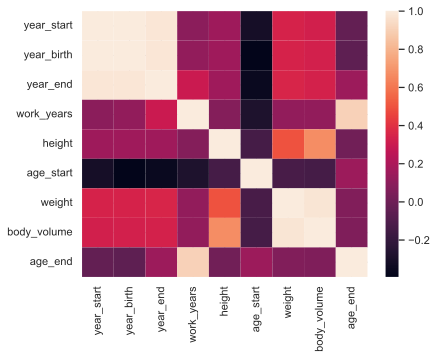

In [28]:
numerical = list(
    set(data.columns)
    - set(
        [
            "position",
            "birth_date",
            "name",
            "college",
        ]
    )
)
corr_matrix = data[numerical].corr()
sns.heatmap(corr_matrix);

**Висока кореляція між деякими фічами, для будування моделі треба прибрати одну з тих, в яких кореляція більша за 0.8, дивно лише те, що немає кореляції між body volume та height, хоча і мас, і ріст є задіяними в створенні фічі**

In [29]:

f, ax = plt.subplots(figsize=(6.5, 6.5))
sns.despine(f, left=True, bottom=True)
position_ranking = ['F-C', 'C-F', 'C', 'G', 'F', 'F-G', 'G-F']
sns.scatterplot(x="weight", y="height",
                hue="position", size="body_volume",
                palette="ch:r=-.2,d=.3_r",
                hue_order=position_ranking,
                sizes=(1, 8), linewidth=0,
                data=data, ax=ax)

<Axes: xlabel='weight', ylabel='height'>

**Бачимо деяку залежність ваги та росту з позицією у грі: зі зростанням ваги та маси колір темнішає(позиція змінюється), можна знайти пряму залежність позиції від параметрів. Чітко видно лінію аутлаєрів близько росту 5.0 та трохи вище за 6.0 де намішано багато позицій та співвідношення вага/ріст**

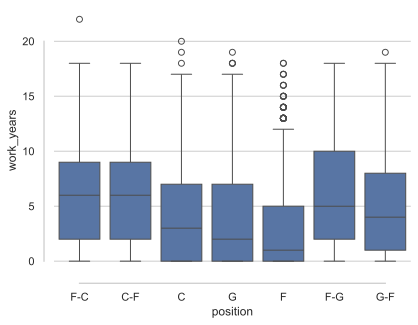

In [30]:
sns.boxplot(x="position", y="work_years", data=data)
sns.despine(offset=10, trim=True)

**Боксплоти вказують на квантилі та середнє значення вибірки. Дані приблизно однакові у F-C, C-F та F-G. У C, G, F Багато аутлаєрів що лежать вище 3 квантиля, для тренування моделі краще буде їх прибрати.**

<Axes: >

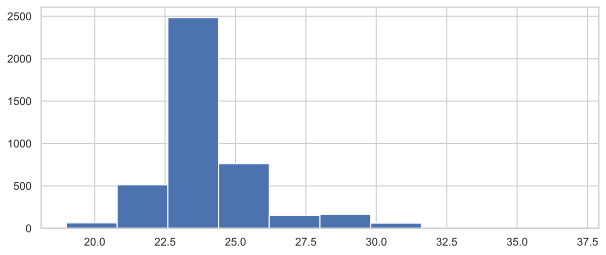

In [31]:
data['age_start'].hist(figsize=(10, 4))

**Зображено на гістограмі розподіл віку в який гравці починають кар'єру. Взагалі, більшість починає у проміжку від 22.5 до 25. Гістограмма схожа на нормальний розподіл Гауса**

<Axes: ylabel='Density'>

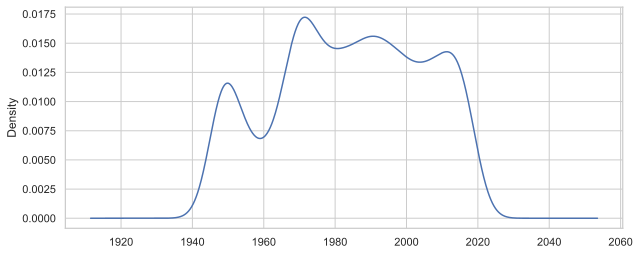

In [32]:
data['year_start'].plot(kind='density', figsize=(10, 4))

**У кінці 50-х - 60-х спостерігається невелика кількість починаючих футболістів, можу припустити, що це через війну у В'єтнамі куди спортивні хлопці відправлялися. З 1970 після великого вибуху починаючих гравців і досі іде спад**

<Axes: xlabel='work_years', ylabel='year_start'>

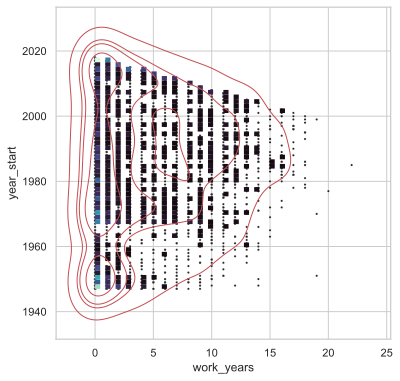

In [33]:
f, ax = plt.subplots(figsize=(6, 6))
sns.scatterplot(x='work_years', y='year_start', s=5, color=".15", data=data)
sns.histplot(x='work_years', y='year_start', bins=50, pthresh=.1, cmap="mako", data=data)
sns.kdeplot(x='work_years', y='year_start', levels=5, color="r", linewidths=1, data=data)

**На протязі всього часу більшість гравців грала не більше року, kdeplot як раз вказує на найбільшу плотність розташування точок в цьому проміжку. Логічно та й спостерігається на скаттерплоті, що ті, хто починав грати у 80-х - 2000-х в середньому грали більше часу, серед нових даних немає людей які б грали так довго через те, що ще не пройшло достатньо часу, щоб були такі люди. Є деякі аутлаєри - гравці, що грали близько 20 років та кількість не суттєва щоб звертати увагу**

<Axes: xlabel='year_birth', ylabel='body_volume'>

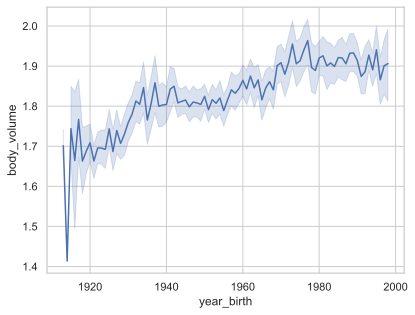

In [34]:

sns.lineplot(x="year_birth", y="body_volume",
             data=data)

**Видно, що з плином часу конституція тіла гравців зростала: маса, ріст збільшувалися. З кінця 70х вона тримається на одному рівні, але порівняно з 20-ими є великий скачок, зміна доволі значна. Прослідковується аутлаєри на початку графіка, не звертаєм увагу**